<p align="center">
  <img title = 'logo' alt = 'logo' height="700" src="https://mediaassets.koaa.com/cordillera-network/wp-content/uploads/sites/11/2018/09/26174923/The-Office-logo--1024x576.jpg">
</p>

<h1 style="text-align:center;border:10px solid #C8A972;">Introduction</h1>

This analysis concerns the **very** popular TV show - "The Office". It includes both the analysis of the scripts as well as the analysis of some other data from the IMDb dataset. The methods used include word clouds, PCA, n-grams and some graph analysis. 

I hope you enjoy it!

<h1 style="text-align:center;border:10px solid #C8A972;">The Libraries</h1>

In [103]:
#importing built-in libraries
import random
import re
from io import BytesIO

#importing requests for making HTTP requests
import requests

#importing numpy and pandas for data manipulation
import numpy as np
import pandas as pd

#importing networkx and matplotlib for creating the interactions graph
import networkx as nx
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

#importing wikipedia to get access to wiklipedia data
import wikipedia

#importing PIL for image processing
from PIL import Image

#importing plotly and cufflinks for creating visualizations
import plotly_express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
import plotly.io as pio
import cufflinks as cf
cf.go_offline()

# setting default template to plotly_dark for all visualizations
pio.templates.default = "plotly_dark"
# for charts to be rendered properly
init_notebook_mode()

# importing tensorflow and tf_hub for finding similar episodes
#import tensorflow as tf
import tensorflow_hub as hub
from sklearn.decomposition import PCA
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.feature_extraction.text import CountVectorizer

#for sentiment analysis
from textblob import TextBlob

#importing wordcloud for creating word clouds
from wordcloud import WordCloud, STOPWORDS


<h1 style="text-align:center;border:10px solid #C8A972;">The Data</h1>

Time to spill some beans.

<p align="center">
  <img title = 'kevin' alt = 'kevin chilli' width="800" height="552" src="https://media1.giphy.com/media/v1.Y2lkPTc5MGI3NjExMGhkbHlmczRpMWgzcGE0ZmVvZ2gwZmZkOXZ2N3JjZWlsNGFicnJ0NiZlcD12MV9pbnRlcm5hbF9naWZfYnlfaWQmY3Q9Zw/cE9GVwn2mJwoSvScrI/giphy.webp">
</p>

In [104]:
#read in the data
office = pd.read_csv('The-Office-Lines-V4.csv', encoding='latin-1') #transcript of the show
episodesData = pd.read_csv('the_office_series.csv') #more data about the episodes (duration, viewership, IMDB rating, etc.)
                          
#dropping the unnamed columns with NAs or no useful information, repeated index columns
office = office.drop('Unnamed: 6', axis=1)
episodesData = episodesData.drop('Unnamed: 0', axis=1)


## Understanding the data

In [105]:
episodesData.head()

,Season,EpisodeTitle,About,Ratings,Votes,Viewership,Duration,Date,GuestStars,Director,Writers
0,1,Pilot,The premiere episode introduces the boss and s...,7.5,4936,11.2,23,24 March 2005,NaN,Ken Kwapis,Ricky Gervais |Stephen Merchant and Greg Daniels
1,1,Diversity Day,Michael's off color remark puts a sensitivity ...,8.3,4801,6.0,23,29 March 2005,NaN,Ken Kwapis,B. J. Novak
2,1,Health Care,Michael leaves Dwight in charge of picking the...,7.8,4024,5.8,22,5 April 2005,NaN,Ken Whittingham,Paul Lieberstein
3,1,The Alliance,"Just for a laugh, Jim agrees to an alliance wi...",8.1,3915,5.4,23,12 April 2005,NaN,Bryan Gordon,Michael Schur
4,1,Basketball,Michael and his staff challenge the warehouse ...,8.4,4294,5.0,23,19 April 2005,NaN,Greg Daniels,Greg Daniels


The Office IMDB dataset contains:

**Season** : Season Number ( 1 to 9 )

**EpisodeTitle** : Name of the episode

**About** : Description of the episode

**Ratings** : Ratings given to the episode on IMDb

**Votes** : Votes given to the episode on IMDb

**Viewership** : Number of viewers in US ( in millions )

**Duration** : Duration of the episode ( in minutes ) 

**Date** : Release date of the episode

**GuestStars** : Number of guest stars appeared on the episode

**Director** : Director(s) of the episode

**Writers** : Writer(s) of the episode

The 'Transcript' dataset contains all the dialogues in the show, along with the name of the speaker and some other information.

In [106]:
office.head()

,season,episode,title,scene,speaker,line
0,1,1,Pilot,1,Michael,All right Jim. Your quarterlies look very good...
1,1,1,Pilot,1,Jim,"Oh, I told you. I couldn't close it. So..."
2,1,1,Pilot,1,Michael,So you've come to the master for guidance? Is ...
3,1,1,Pilot,1,Jim,"Actually, you called me in here, but yeah."
4,1,1,Pilot,1,Michael,"All right. Well, let me show you how it's done."



**season** : season number

**episode** : episode number

**title** : episode title

**scene** : scene number

**speaker** : speaker in the scene

**line** : lines of the speaker

Before going any further, let's check if there are any missing values in the datasets.

In [107]:
#checking for missing values
office.isnull().sum()

season     0
episode    0
title      0
scene      0
speaker    0
line       0
dtype: int64

In [108]:
#checking for missing values
episodesData.isnull().sum()

Season            0
EpisodeTitle      0
About             0
Ratings           0
Votes             0
Viewership        0
Duration          0
Date              0
GuestStars      159
Director          0
Writers           0
dtype: int64

No NAs or NULLs - great success! Well, aside for GuestStars, but I'm not interested in those for this analysis. Now, let's see how many speakers are there in the series.

In [109]:
print(office['speaker'].unique())
office['speaker'].unique().shape

['Michael' 'Jim' 'Pam' 'Dwight' 'Jan' 'Michel' 'Todd Packer' 'Phyllis'
 'Stanley' 'Oscar' 'Angela' 'Kevin' 'Ryan' 'Man' 'Roy' 'Mr. Brown' 'Toby'
 'Kelly' 'Meredith' 'Travel Agent' 'Man on Phone' 'Everybody' 'Lonny'
 'Darryl' 'Teammates' 'Michael and Dwight' 'Warehouse worker' 'Madge'
 'Worker' 'Katy' 'Guy at bar' 'Other Guy at Bar' 'Guy At Bar'
 'Pam and Jim' 'Employee' "Chili's Employee" 'Warehouse Guy'
 'Warehouse guy' 'Man in Video' 'Video' 'Actor' 'Redheaded Actress'
 "Mr. O'Malley" 'Albiny' "Pam's Mom" 'Carol' 'Bill' 'Everyone' 'Crowd'
 'song' 'Song' 'Dwight and Michael' 'Sherri' 'Creed' 'Devon' 'Children'
 'Kid' 'Ira' "Ryan's Voicemail" 'Christian' 'Hostess'
 'Michael and Christian' 'Sadiq (IT guy)' 'Mark' 'Improv Teacher'
 'Mary-Beth' 'Girl acting Pregnant' 'Actress' 'Michael and Jim'
 'Kevin & Oscar' 'All' 'Liquor Store Clerk' 'JIm' 'Bob Vance'
 'Phyllis, Meredith, Michael, Kevin' 'Captain Jack' 'Brenda'
 'Darryl and Katy' 'Jim and Pam' 'Billy Merchant' 'Doctor' 'Lab Tech'
 'Da

(775,)

Well, there's a lot of them - 775 to be exact. However, not all of them are unique characters, e.g. one example is two lines described as "Andy & Michael" and "Andy and Michael" - counted as two, despite being the same characters. Therefore, there are definitely more reocurring names due to spelling errors, the way the script is written and other factors.

<h1 style="text-align:center;border:10px solid #C8A972;">General Analysis</h1>

This section does not concern the script yet, but is an introductory analysis of some interesting statistics concerning "The Office".

<h3 style="text-align:center;border:5px solid #78FF88;">Number of episodes per season</h3> 

In [110]:
g1 = episodesData.groupby(['Season'], as_index=False).count()
g1 = g1[['Season','EpisodeTitle']]
g1.rename(columns={'EpisodeTitle':'NoOfEpisodes'}, inplace=True)

fig = px.bar(g1,x='Season',y='NoOfEpisodes', color_discrete_sequence=['green'])
fig.update_layout(title_text='Number of episodes per Season')
fig.show()

As it can be seen, seasons 5 and 6 have the most number of episodes (26), while season 1 has the least (6), as it was the "Pilot" season to see whether people will like the show. Aftern learning the audience's taste, later seasons have roughly 22-24 episodes, with season 4 being an outlier with only 14 episodes.

<h3 style="text-align:center;border:5px solid #78FF88;">Top 10 highest rated episodes</h3> 

In [111]:
top_10_rated = (episodesData.sort_values(by=['Ratings','Votes'],ascending=False)).iloc[:10,:]
fig = px.bar(top_10_rated,x='EpisodeTitle',y='Ratings',color_discrete_sequence=['purple'])
fig.update_layout(title_text='Top 10 highest rated episodes of all time')
fig.show()

<h3 style="text-align:center;border:5px solid #78FF88;">Top 10 longest episodes</h3> 

In [112]:
top_10_long = (episodesData.sort_values(by=['Duration','Ratings'],ascending=False)).iloc[:10,:]
fig = px.bar(top_10_long,x='EpisodeTitle',y='Duration',color_discrete_sequence=['gold'])
fig.update_layout(title_text='Top 10 longest episodes of all time',template='plotly_dark')
fig.show()

<h3 style="text-align:center;border:5px solid #78FF88;">Ratings for each season</h3> 

In [113]:
rats = pd.DataFrame(episodesData.groupby(['Season'])['Ratings'].mean()).reset_index()
fig = px.line(rats,x='Season',y='Ratings')
fig.update_layout(title_text='Ratings for each season',template='plotly_dark')
fig.show()

After mixed reception of the first season and reworking the formula to make the series less "edgy", later seasons improved in ratings. A significant dip can be seen for season 8, which is the first season without Michael Scott. 

<h3 style="text-align:center;border:5px solid #78FF88;">Number of episodes written per person</h3>

In [114]:
mlb = MultiLabelBinarizer()
writerDf = pd.DataFrame({})
writerDf['WriterList'] = episodesData['Writers'].apply(lambda x: [y.strip() for y in x.split('|')])

mlb.fit(writerDf['WriterList'])
#creating columns = the classes of the multilabelbinarizer
writerDf[mlb.classes_] = mlb.transform(writerDf['WriterList'])
writerDf.drop('WriterList',axis = 1, inplace = True)

writerEpisodes = writerDf.sum().reset_index()
writerEpisodes.columns = ['Writer', 'Number of Episodes']
writerEpisodes = writerEpisodes.sort_values(by = 'Number of Episodes')
fig = px.bar(writerEpisodes,x = 'Number of Episodes', y = 'Writer', title = 'Number of Episodes Written',
             height  = 1000, color = 'Number of Episodes', color_continuous_scale='greens', template = 'plotly_dark')
fig.show()

Mindy Kaling (a.k.a Kelly Kapoor) wrote the biggest number of episodes for "The Office" - 22 - while also being on the main characters in the show. Second most producign writer was Paul Liebersteing (a.k.a Toby Flenderson) with 16 episodes, and B. J. Novak (a.k.a Ryan Howard) is on the third spot with 15 episodes together with two other writes for the show who only made guest appearances in a few episodes.

<h3 style="text-align:center;border:5px solid #78FF88;">Relation between number of dialogues and rating</h3>

In [115]:
episodeDialogues = office.groupby('title')['line'].count().reset_index()
episodeDialogues = pd.merge(episodeDialogues,episodesData, left_on = 'title', right_on = 'EpisodeTitle')
fig  = px.scatter(episodeDialogues, x = 'line', y = 'Ratings', trendline = 'ols', color = episodeDialogues['Season'].astype('category'),
                 hover_name='EpisodeTitle',
                 title = 'Relation Between Number of Dialogues and Rating')
fig.show()

As it can be seen on the graph, there is *some* correlation between the number of dialogues and ratings for a given season. It's most significant in season 9, with R squared metric equal to ~0.5. Some seasons show a negative relationship (season 1 and season 7) while others are flat (season 5).

<h1 style="text-align:center;border:10px solid #C8A972;">Word Clouds!</h1>

A regular WordCloud() function could've been used, however, this make_cloud function takes both the string and a background image to create a word cloud.

In [116]:
#function for grey colour of cloud
def grey_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(60, 100)

#function that makes the cloud
def make_cloud(x, url):
    response = requests.get(url) 
    mask = np.array(Image.open(BytesIO(response.content))) #converting image to numpy array to make mask
    cloud = WordCloud(background_color='black',
                      width=5000, height=5000, 
                      max_words=2000, max_font_size=200, 
                      min_font_size=1, mask=mask, stopwords=STOPWORDS)
    cloud.generate(x) #generating WordCloud
    
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(cloud.recolor(color_func=grey_color_func, random_state=3), interpolation='bilinear') # Adding grey colour
    ax.set_axis_off()
    
    plt.show(cloud)

Before going into further analysis, let's see what the Wikipedia page of "The Office" has to say!

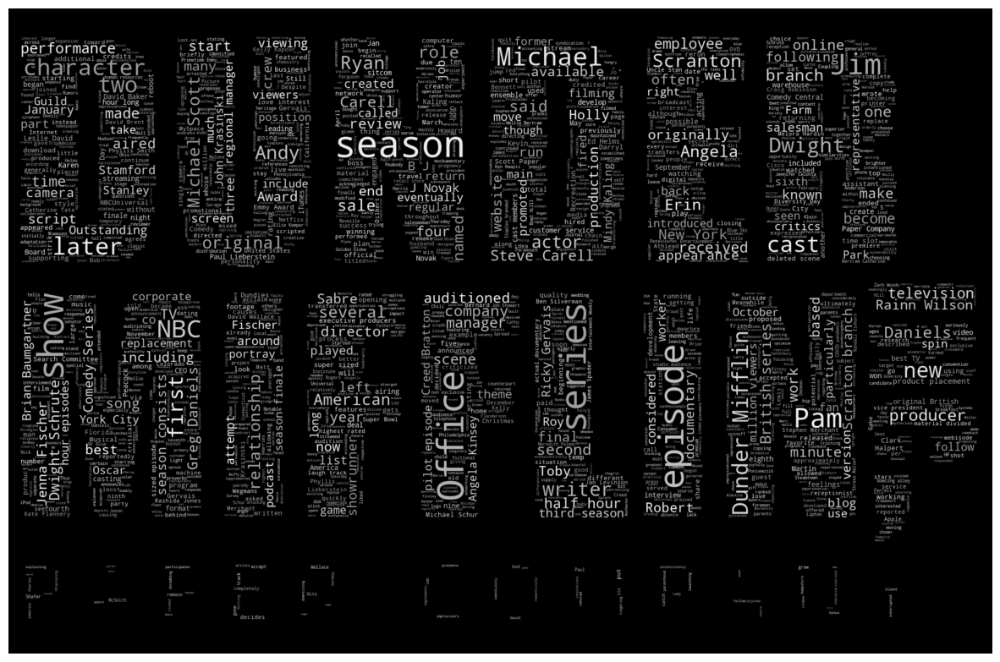

In [117]:
# Looking up wikipedia pages for the TV show
wikipedia.search('The Office (US)')

# Collecting the content to create a word cloud
the_office = wikipedia.page('The Office (American TV Series)')
df_content = the_office.content

# Creating a word cloud
make_cloud(df_content, 'https://i.etsystatic.com/16438614/r/il/c31bd2/1806659071/il_fullxfull.1806659071_pn8j.jpg')

As it can be seen, some of the most popular words describing the show on this particular page are: "office", "episode", "season" and "series" - which is to be expected, as it's the page describing the show and not the transcrpits. However, some of the characters' names can be seen too: "Michael", "Pam" and "Jim", as well as the name of the company they worked for - "Dunder Mifflin".

## Most used words in the series

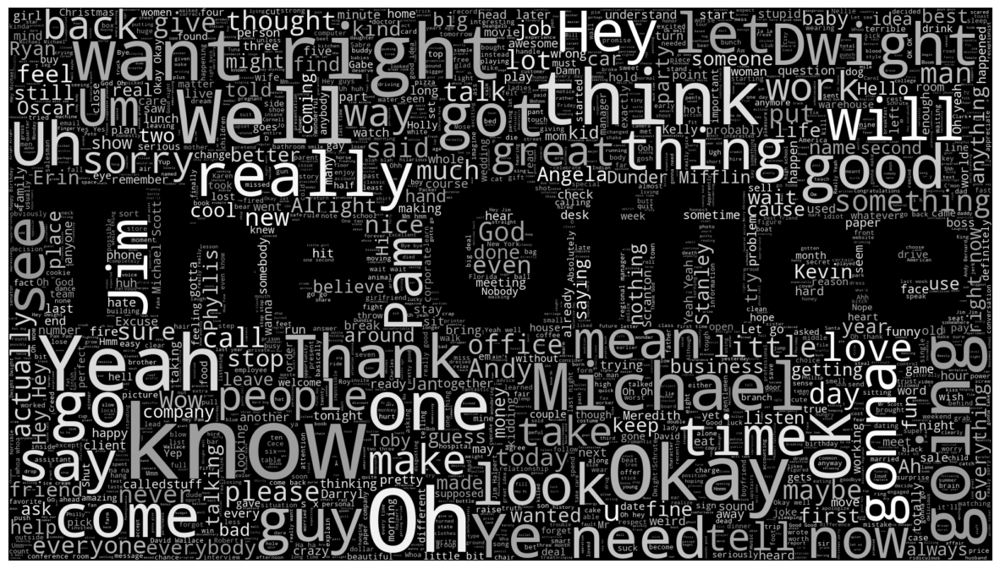

In [118]:
office_all = office.copy()

make_cloud(office_all['line'].sum(), 'https://i.ibb.co/PG0hr7Z/6.png')

## Most used words by Michael 

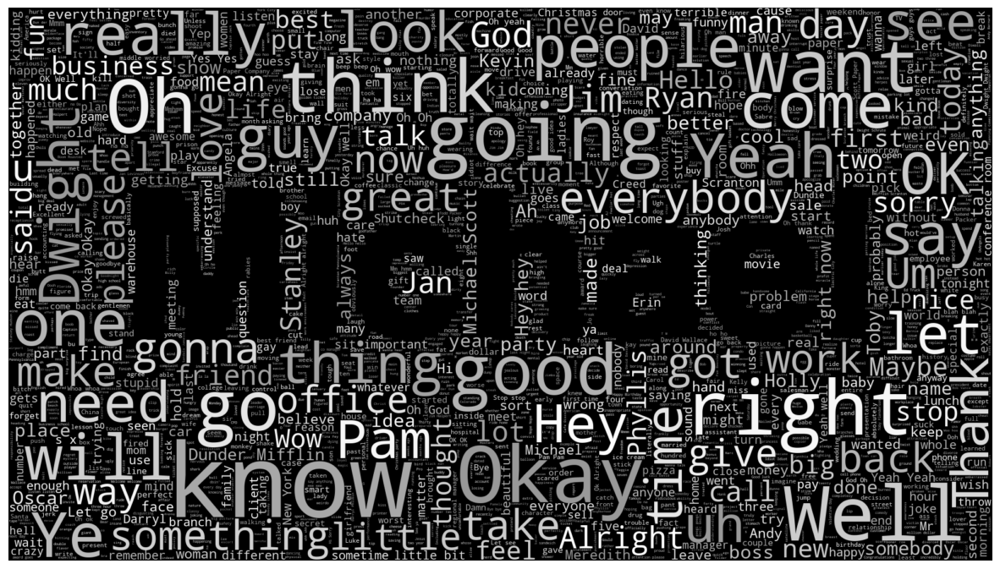

In [119]:
office_filtered_m = office[office['speaker'] == 'Michael'] 

make_cloud(office_filtered_m['line'].sum(), 'https://i.ibb.co/f2hvgtJ/7.png')

## Most used words by Dwight

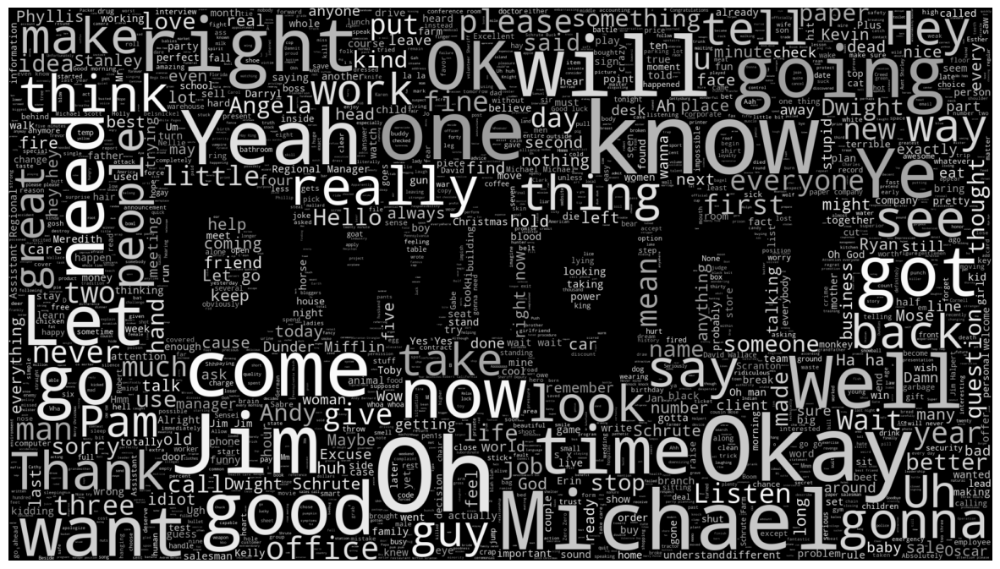

In [120]:
office_dwight = office[office['speaker'] == 'Dwight'] 
  
make_cloud(office_dwight['line'].sum(), 'https://i.ibb.co/wBwtp79/8.png')

## Most used words by Jim

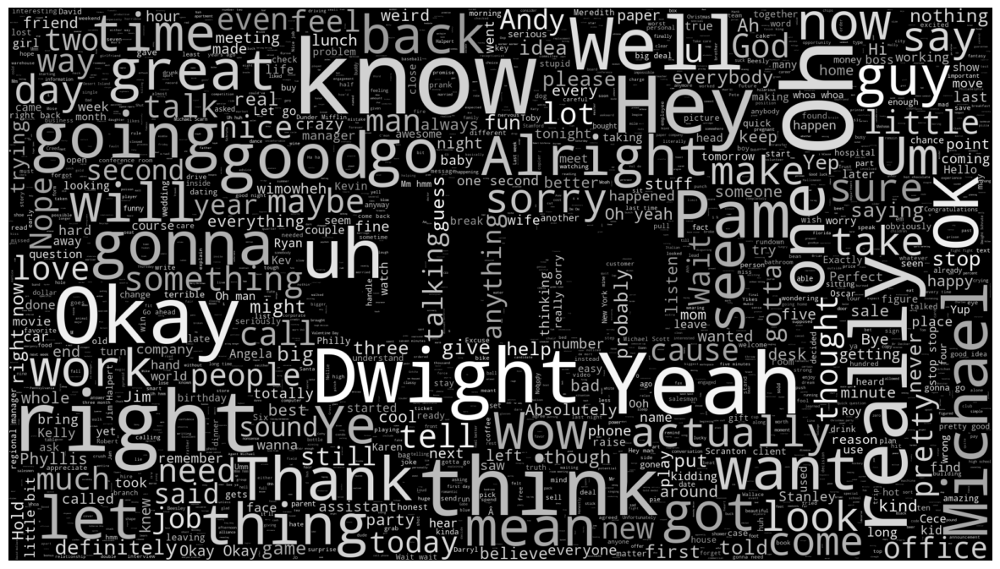

In [121]:
office_jim = office[office['speaker'] == 'Jim'] 
  
make_cloud(office_jim['line'].sum(), 'https://i.ibb.co/wwGHd9P/9.png')

## Most used words by Pam

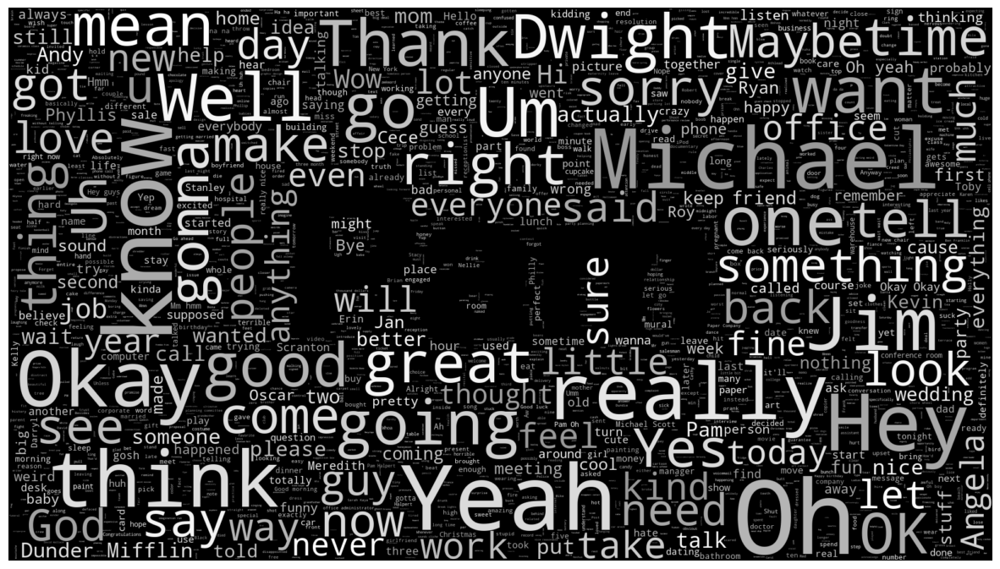

In [122]:
office_pam = office[office['speaker'] == 'Pam'] 
  
make_cloud(office_pam['line'].sum(), 'https://i.ibb.co/ZNJpyN7/10.png')

<h1 style="text-align:center;border:10px solid #C8A972;">Dialogues Analysis</h1>

In this section, let's start with checking who spoke the most in this show!

<h3 style="text-align:center;border:5px solid #78FF88;">Top Speakers</h3>

In [123]:
numberOfLinesSpoken = office['speaker'].value_counts().reset_index()
numberOfLinesSpoken.columns = ['Speaker','Number of Dialogues']
numberOfLinesSpoken = numberOfLinesSpoken.sort_values(by = 'Number of Dialogues', ascending = False)
fig = px.bar(numberOfLinesSpoken[:15][::-1],x = 'Number of Dialogues', y = 'Speaker', orientation = 'h', 
             title = '<b>Top 15 Speakers with the Most Lines</b>',
            color_continuous_scale=px.colors.sequential.Blugrn,color = 'Number of Dialogues',text = 'Number of Dialogues')
fig.show()

Unsurprisingly, it's Michael - the main character of the first 7 seasons. Right after him, there is the "Assistant (to the) Regional Manager" - Dwight, and Michael's right hand - Jim. Surprisingly however, Kevin is the character with the 5th highest number of lines, standing before Angela by 1 line.

<h3 style="text-align:center;border:5px solid #78FF88;">Characters with the biggest number or dialogues each season</h3> 

In [124]:
fig = make_subplots(rows = 3,cols = 3, 
                    subplot_titles=[f'Season {i}' for i in range(1,10)],
                   horizontal_spacing=0.1)

for i in range(3):
    for j in range(3):
        season = i*3 + j + 1
        seasonDf = office[office['season'] == season]
        speakerDialogues = seasonDf['speaker'].value_counts().reset_index()
        speakerDialogues.columns = ['Speaker','Number of Dialogues']
        speakerDialogues = speakerDialogues.sort_values(by = 'Number of Dialogues', ascending = False).iloc[:3,]
        trace = go.Bar(x = speakerDialogues['Number of Dialogues'], y = speakerDialogues['Speaker'], name = f'Season {season}', orientation = 'h')
        fig.add_trace(trace, row = i+1, col = j+1)
fig.update_layout(showlegend = False, title = '<b>Top 3 Speakers each Season</b>')
fig.show()

As it turns out, each season it is the boss who gets to speak the greatest number of lines!

<h1 style="text-align:center;border:10px solid #C8A972;">Sayings Scores</h1>

In this section, I analyse some of the most popular sayings/phrases used in the show to see which characters used them the most. Let's start with some proper formatting of the lines to make the analysis more thorough.

In [125]:
def formatLine(line):
    line = line.lower()
    line = re.sub(r'[^\w\s]','',line)
    return line

office['formatted_lines'] = office['line'].apply(lambda x:formatLine(x))

office.head()

,season,episode,title,scene,speaker,line,formatted_lines
0,1,1,Pilot,1,Michael,All right Jim. Your quarterlies look very good...,all right jim your quarterlies look very good ...
1,1,1,Pilot,1,Jim,"Oh, I told you. I couldn't close it. So...",oh i told you i couldnt close it so
2,1,1,Pilot,1,Michael,So you've come to the master for guidance? Is ...,so youve come to the master for guidance is th...
3,1,1,Pilot,1,Jim,"Actually, you called me in here, but yeah.",actually you called me in here but yeah
4,1,1,Pilot,1,Michael,"All right. Well, let me show you how it's done.",all right well let me show you how its done


Firstly, one of the most important statistics - the number of "That's what she said"'s per season.

In [126]:
def get_count(office,n):
    s_df = office[office['season']==n].reset_index()
    scount = 0
    for i in range(0,len(s_df)):
        x = re.search('thats what she said',s_df['formatted_lines'][i])
        if type(x)==re.Match:
            scount = scount + 1
    return scount

sc , s = [] , []
for i in range(1,10):
    sc.append(get_count(office,i))
    s.append(i)

fig = px.bar(x=sc,y=s,color_discrete_sequence=['#7ec0ee'],
             orientation='h',labels={'sc':'# of jokes',
                                    's':'Season'})
fig.update_layout(title_text='Number of That\'s What She Said Jokes per Season',
                  xaxis_title='Number of "That\'s what she said"\'s',yaxis_title='Season')
fig.show()

Now, let's see who used this phrase the most.

In [127]:
df = office[office['formatted_lines'].str.contains("thats what she said")]
df = df['speaker'].value_counts().reset_index()[:5]
df.columns = ['Speaker', 'Number of References']

fig = go.Figure()
for i in range(len(df)):
    trace = go.Indicator(
        mode = "number",
        value = df.iloc[i,:]['Number of References'],
        title = {"text": f"<b>{df.iloc[i,:]['Speaker']}</b>"},
        domain = {'x': [0.1*(i+1), 0.2*(i+1)], 'y': [0, 1]}
    )
    fig.add_trace(trace)
fig.update_layout(title = "<b>That's What She Said Score</b>",height = 200)
fig.show()

Unsurprisingly, it's Michael. His score is a big one (that's what she said).

In [128]:
df = office[office['formatted_lines'].str.contains('dunder mifflin')]
df = df['speaker'].value_counts().reset_index()[:5]
df.columns = ['Speaker', 'Number of References']
fig = go.Figure()
for i in range(5):
    trace = go.Indicator(
        mode = "number",
        value = df.iloc[i,:]['Number of References'],
        title = {"text": f"<b>{df.iloc[i,:]['Speaker']}</b>"},
        domain = {'x': [0.1*(i+1), 0.2*(i+1)], 'y': [0, 1]}
    )
    fig.add_trace(trace)
fig.update_layout(title = '<b>Dunder Mifflin Score</b>',height = 200)
fig.show()

Moreover, Michael Mentions Dunder Mifflin the most. Surprisingly, Erin takes the 5th place.

In [129]:
df = office[office['formatted_lines'].str.contains("boss|manager")]
df = df['speaker'].value_counts().reset_index()[:5]
df.columns = ['Speaker', 'Number of References']
fig = go.Figure()
for i in range(len(df)):
    trace = go.Indicator(
        mode = "number",
        value = df.iloc[i,:]['Number of References'],
        title = {"text": f"<b>{df.iloc[i,:]['Speaker']}</b>"},
        domain = {'x': [0.1*(i+1), 0.2*(i+1)], 'y': [0, 1]},
    )
    fig.add_trace(trace)
fig.update_layout(title = "<b>Boss / Manager Score</b>",height = 200)
fig.show()

As a real manager should, managers are 4 characters that use this phrase the most. Michael is still in the lead - so who says "Michael" the most?

In [130]:
df = office[office['formatted_lines'].str.contains("michael")]
df = df['speaker'].value_counts().reset_index()[:5]
df.columns = ['Speaker', 'Number of References']
fig = go.Figure()
for i in range(len(df)):
    trace = go.Indicator(
        mode = "number",
        value = df.iloc[i,:]['Number of References'],
        title = {"text": f"<b>{df.iloc[i,:]['Speaker']}</b>"},
        domain = {'x': [0.1*(i+1), 0.2*(i+1)], 'y': [0, 1]},
    )
    fig.add_trace(trace)
fig.update_layout(title = "<b>Michael Score</b>",height = 200)
fig.show()

It's Dwight. Michael takes 4th place. Let's look at some other statistics:

In [131]:
df = office[office['formatted_lines'].str.contains("sale|sales")]
df = df['speaker'].value_counts().reset_index()[:5]
df.columns = ['Speaker', 'Number of References']
fig = go.Figure()
for i in range(len(df)):
    trace = go.Indicator(
        mode = "number",
        value = df.iloc[i,:]['Number of References'],
        title = {"text": f"<b>{df.iloc[i,:]['Speaker']}</b>"},
        domain = {'x': [0.1*(i+1), 0.2*(i+1)], 'y': [0, 1]},
    )
    fig.add_trace(trace)
fig.update_layout(title = "<b>Sale Score</b>",height = 200)
fig.show()

The boss and the top salesman mention sales the most.

In [132]:
df = office[office['formatted_lines'].str.contains("cornell")]
df = df['speaker'].value_counts().reset_index()[:5]
df.columns = ['Speaker', 'Number of References']
fig = go.Figure()
for i in range(len(df)):
    trace = go.Indicator(
        mode = "number",
        value = df.iloc[i,:]['Number of References'],
        title = {"text": f"<b>{df.iloc[i,:]['Speaker']}</b>"},
        domain = {'x': [0.1*(i+1), 0.2*(i+1)], 'y': [0, 1]},
    )
    fig.add_trace(trace)
fig.update_layout(title = "<b>Cornell Score</b>",height = 200)
fig.show()

It's clear to see who went to Cornell - Andy.

In [133]:
df = office[office['formatted_lines'].str.contains("beet|beets")]
df = df['speaker'].value_counts().reset_index()[:5]
df.columns = ['Speaker', 'Number of References']
fig = go.Figure()
for i in range(len(df)):
    trace = go.Indicator(
        mode = "number",
        value = df.iloc[i,:]['Number of References'],
        title = {"text": f"<b>{df.iloc[i,:]['Speaker']}</b>"},
        domain = {'x': [0.1*(i+1), 0.2*(i+1)], 'y': [0, 1]},
    )
    fig.add_trace(trace)
fig.update_layout(title = "<b>Beets Score</b>",height = 200)
fig.show()

Dwight, the real beets afficionado, mentions this vegetable the most.

In [134]:
df = office[office['formatted_lines'].str.contains("schrute")]
df = df['speaker'].value_counts().reset_index()[:5]
df.columns = ['Speaker', 'Number of References']
fig = go.Figure()
for i in range(len(df)):
    trace = go.Indicator(
        mode = "number",
        value = df.iloc[i,:]['Number of References'],
        title = {"text": f"<b>{df.iloc[i,:]['Speaker']}</b>"},
        domain = {'x': [0.1*(i+1), 0.2*(i+1)], 'y': [0, 1]},
    )
    fig.add_trace(trace)
fig.update_layout(title = "<b>Schrute Score</b>",height = 200)
fig.show()

Dwight really likes to say his last name.

In [135]:
df = office[office['formatted_lines'].str.contains("dunder mifflin this is")]
df = df['speaker'].value_counts().reset_index()[:5]
df.columns = ['Speaker', 'Number of References']
fig = go.Figure()
for i in range(len(df)):
    trace = go.Indicator(
        mode = "number",
        value = df.iloc[i,:]['Number of References'],
        title = {"text": f"<b>{df.iloc[i,:]['Speaker']}</b>"},
        domain = {'x': [0.1*(i+1), 0.2*(i+1)], 'y': [0, 1]},
    )
    fig.add_trace(trace)
fig.update_layout(title = "<b>\"Dunder mifflin this is ...\" Score</b>",height = 200)
fig.show()

This classic phrase was used by Pam 21 times, while Erin who was a receptionist for a much shorter time used it 6 times.

In [136]:
df = office[office['formatted_lines'].str.contains("ryan")]
df = df['speaker'].value_counts().reset_index()[:5]
df.columns = ['Speaker', 'Number of References']
fig = go.Figure()
for i in range(len(df)):
    trace = go.Indicator(
        mode = "number",
        value = df.iloc[i,:]['Number of References'],
        title = {"text": f"<b>{df.iloc[i,:]['Speaker']}</b>"},
        domain = {'x': [0.1*(i+1), 0.2*(i+1)], 'y': [0, 1]},
    )
    fig.add_trace(trace)
fig.update_layout(title = "<b>Ryan Score</b>",height = 200)
fig.show()

"The Temp" was mentioned the most by Michael - yet another win for Mr. Scott.

<h1 style="text-align:center;border:10px solid #C8A972;">N-grams</h1>

This section concerns the visualisation of the most frequently used n-grams in the series.

## Defining a function to visualise n-grams


In [137]:
def get_top_ngram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) 
                  for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:10]

<h3 style="text-align:center;border:5px solid #78FF88;">The most frequently used 1-grams</h3> 

In [138]:
top_bigrams = get_top_ngram(office['line'],1)[:15]
x,y = map(list,zip(*top_bigrams))
px.bar(x = y,y = x)

<h3 style="text-align:center;border:5px solid #78FF88;">The most frequently used 2-grams</h3> 

In [139]:
top_bigrams = get_top_ngram(office['line'],2)[:15]
x,y = map(list,zip(*top_bigrams))
px.bar(x = y,y = x)

<h3 style="text-align:center;border:5px solid #78FF88;">The most frequently used 3-grams</h3> 

In [140]:
from sklearn.feature_extraction.text import CountVectorizer
top_trigrams = get_top_ngram(office['line'],3)[:15]
x,y = map(list,zip(*top_trigrams))
px.bar(x = y,y = x)

<h3 style="text-align:center;border:5px solid #78FF88;">The most frequently used 4-grams</h3> 

In [141]:
from sklearn.feature_extraction.text import CountVectorizer
top_trigrams = get_top_ngram(office['line'],4)[:15]
x,y = map(list,zip(*top_trigrams))
px.bar(x = y,y = x)

<h1 style="text-align:center;border:15px solid #C8A972;">Sentiment Analysis</h1>

This sections concerns the sentiment analysis of the script. It's conducted on the *formatted_lines* defined in the **Sayings Scores** section.

In [142]:
# Defining a function to check the sentiment polarity (whether it is positive or negative or neutral)
def polarity(text):
    return TextBlob(text).sentiment.polarity

office['polarity_score'] = office['formatted_lines'].\
   apply(lambda x : polarity(x))
   
   
px.histogram(office,x='polarity_score')

In [143]:
# Defining a function to classify the sentiment based on the polarity 
def sentiment(x):
    if x<0:
        return 'Negative'
    elif x==0:
        return 'Neutral'
    else:
        return 'Positive'
    
office['polarity'] = office['polarity_score'].map(lambda x: sentiment(x))

px.bar(x = office.polarity.value_counts().index,
        y = office.polarity.value_counts(),
        labels={'x':'Sentiment','y':'Count'},
        title='Sentiment Analysis of The Office Dialogues')

As it can be seen, most of the dialoges have a neutral sentiment. Notably, there's a lot more positive than negative dialogues (17 672 vs 6958). Now, let's see who has the highest average sentiment score!

In [144]:
# the most positive (main) characters

main_characters = ['Michael', 'Dwight', 'Jim', 'Pam', 'Andy', 'Angela', 'Kevin', 'Oscar', 'Erin', 'Ryan', 'Jan', 'Kelly', 'Creed', 'Stanley', 'Phyllis', 'Meredith', 'Toby', 'Darryl']
main_characters_df = office[office['speaker'].isin(main_characters)]
main_characters_df = main_characters_df.groupby('speaker')['polarity_score'].mean().reset_index()
main_characters_df = main_characters_df.sort_values(by = 'polarity_score', ascending = False)

fig = px.bar(main_characters_df, x = 'polarity_score', y = 'speaker', orientation = 'h',
                title = 'Sentiment Analysis of Main Characters',
                color = 'polarity_score', color_continuous_scale = 'Viridis',
                labels = {'polarity_score':'Average Sentiment Score','speaker':'Character'})
fig.show()



Micheal's dialogues appear to have the most positive sentiment in the series. He's followe by Jim, Ryan and (surprisignly) Jan. The least positive of the main characters are Meredith and (unsurprisingly) Stanley. 

<h1 style="text-align:center;border:10px solid #C8A972;">Finding Similar Episodes with PCA</h1>

In [145]:
episodeCorpus = pd.DataFrame({'Episode Number' : [], 'Full Text': [], 'Season' : []})
episodes = []
episodeTexts = []
seasons = []
for season in range(1,10):
    subSeason = office[(office['season'] == season)]
    for episodeNo, df in subSeason.groupby('episode'):
        full_text = df['formatted_lines'].values
        episodes.append(episodeNo)
        episodeTexts.append(" ".join(full_text).lower())
        seasons.append(season)
episodeCorpus['Episode Number'] = episodes
episodeCorpus['Full Text'] = episodeTexts
episodeCorpus['Season'] = seasons

module_url = "https://www.kaggle.com/models/google/universal-sentence-encoder/TensorFlow2/universal-sentence-encoder/2" 
model = hub.load(module_url)

features = model(episodeCorpus['Full Text'].values)
pca = PCA(n_components=2, random_state=42)
reduced_features = pca.fit_transform(features)

episodeTitles = episodesData['EpisodeTitle'].to_list()
episodeTitles.pop(108)
episodeTitles.pop(95)

episodeCorpus['Dimension 1'] = reduced_features[:,0]
episodeCorpus['Dimension 2'] = reduced_features[:,1]
episodeCorpus['Episode Titles'] = episodeTitles
fig = px.scatter(episodeCorpus, x = 'Dimension 1', y = 'Dimension 2', color = 'Season', hover_name='Episode Titles',
                title = '<b>Finding Similar Episodes</b>')
fig.update_traces(marker=dict(size=12))
fig.show()

This graph is extremely interesting as it helps to find episodes that were more of less similar in terms of their content. It can be seen that the festival themed episodes are clubbed together on the right side of the graph and are quite different from the other episodes. It can also be seen S05E25 - Broke (the farmost left) is much different from all the other episodes. We can use this graph to find episodes that do not fall in the central grouping and thus are somewhat different. Few of these Episodes are : **Sexual Harassment**, **PDA**, **Junior Salesman**, **Trivia** and **Livin' the Dream**.

<h1 style="text-align:center;border:10px solid #C8A972;">Visualising Interactions between Characters</h1>

C:\Users\kacch\AppData\Local\Temp\ipykernel_8604\1279815184.py:58: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



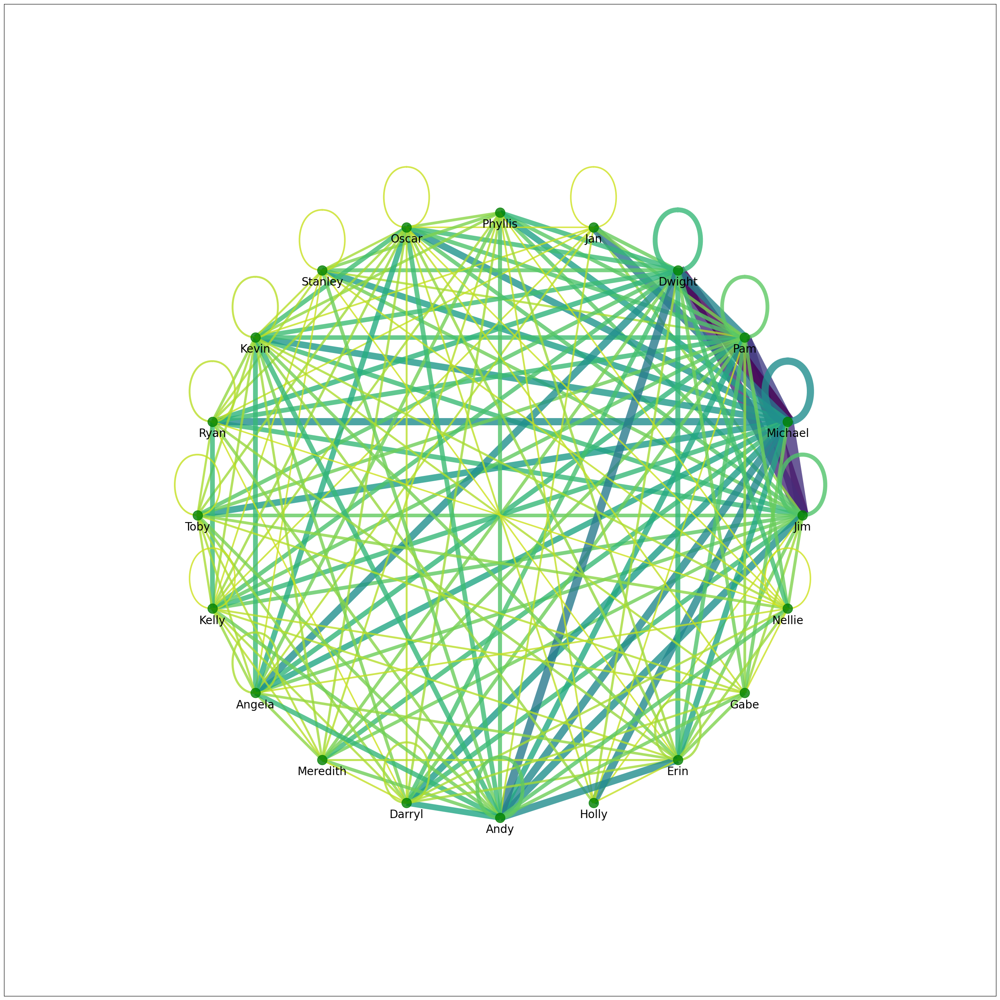

In [146]:
#creating the interaction graph

#create episode_id for comparison later 
office['episode_id'] = office['season'].astype(str)+office['episode'].astype(str)

#get 20 main characters 
main_characters = list(office['speaker'].value_counts().index[:20])

main_characters_shuffle = random.sample(main_characters, len(main_characters))
#print(main_characters_suffle)
character_dict = {character: i for i, character in enumerate(main_characters)}
id_dict = {i: character for i, character in enumerate(main_characters)}

#create networkx object
G = nx.Graph()

#get coversation info between characters
scene_before = ""
episode_id_before = -1
for i in range(len(office)):

    #check if episode and location of text is the same
    if scene_before != office["scene"].iloc[i] or office["episode_id"].iloc[i] != episode_id_before:
        scene_before = office.iloc[i]["scene"]
        episode_id_before = office.iloc[i]["episode_id"]
        continue

    scene_before = office.iloc[i]["scene"]
    episode_id_before = office.iloc[i]["episode_id"]

    #get characters
    c1 = office["speaker"].iloc[i]
    c2 = office["speaker"].iloc[i+1]

    #fail check for character not in the interested list 
    if c1 not in main_characters_shuffle or c2 not in main_characters_shuffle:
        continue

    sorted_characters = sorted([c1, c2])
    try:
        #add +1 to weight if characters have conversation on the same sence
        G.edges[sorted_characters]["weight"] += 1
    except KeyError:
        G.add_edge(sorted_characters[0], sorted_characters[1], weight=1)
        
def plot_fig():
    plt.figure(figsize=(25, 25))
    pos = nx.circular_layout(G)
    edges = G.edges()
   
    #darker colors for higher weigth
    colors = [G[u][v]['weight']**0.39 for u, v in edges]
    
    #only looking into characters that had conversation more than 10 times
    weights = [G[u][v]['weight']**0.4 if G[u][v]['weight'] > 10 else 0 for u, v in edges]
    
    #colors
    cmap = matplotlib.cm.get_cmap('viridis_r')
 
    nx.draw_networkx(G, pos, width=weights, edge_color=colors,
                     node_color="green", edge_cmap=cmap, with_labels=False, alpha=0.80)
   
    labels_pos = {name: [pos_list[0], pos_list[1]-0.04] for name, pos_list in pos.items()}
    nx.draw_networkx_labels(G, labels_pos, font_size=20, font_family="sans-serif",
                            font_color="black", font_weight='normal')

    ax = plt.gca()
    ax.margins(0.25)
    plt.axis("equal")
    plt.tight_layout()

#plotting the graph        
plot_fig()

The graph shows the interactions between the main characters (20 most-speaking ones). I also included self-loops around the nodes, that represent how much characters talk to themselselves or how many consecutive lines of a single character there are. As it can be seen, the most interactions are between 4 most recognizable characters - Michael, Jim, Pam and Dwight. Also, the self-loop is the widest at "Michael" node. Other notable interactions are between Erin and Andy, Darryl and Andy and Dwight and Andy, as well as between Michael and Holly and Michael and Jan. 

# I hope you enjoyed this analysis!

<p align="center">
  <img title = 'michael' alt = 'michael pointing fingers' src="https://media0.giphy.com/media/v1.Y2lkPTc5MGI3NjExcWh3YWx2aTZ2cGx6cTgzOWgwbTk5MWV5Zmw3dXR3MWxtdHczaGt0byZlcD12MV9pbnRlcm5hbF9naWZfYnlfaWQmY3Q9Zw/cXblnKXr2BQOaYnTni/giphy.webp">
</p>